# OH0037, M, middle-aged, ambidextrous

In [182]:
import pandas as pd
from utils import *
from joint_angles.calculate_joint_angles import *
# Import everything needed to edit video clips 
from moviepy.editor import *
# for 3d plots
import plotly.express as px
#for heatmaps
import seaborn as sns

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data

In [ ]:
data_npy_path = "../data/OH0037.npy"
data_npy = np.load(data_npy_path)

df_test = pd.DataFrame()
df_test['time'] = np.array([time/30 for time in range(6310)])
for i in range(17):
    df_point = pd.DataFrame(data_npy[:, i])
    df_test[f'point_{i}'] = df_point.values.tolist()

df_test.rename(columns = {'point_5':'leftshoulder', 'point_6':'rightshoulder', 
                     'point_8':'rightelbow', 'point_7':'leftelbow', 
                     'point_10':'rightwrist', 'point_9':'leftwrist',
                     'point_12':'righthip', 'point_11':'lefthip'}, inplace = True)

df_test.head()

In [31]:
#Load data
data_path = "../data/OH0037.csv"
data = pd.read_csv(data_path)
df = data[['rgb_frameid', 'kp3ds']]
#Convert data into float values and get body points
df['kp3ds'] = df['kp3ds'].apply(str2float)
df_points = get_df_points(df)
df = pd.concat([df, df_points], axis=1)
df.drop(columns=['kp3ds'], inplace=True)
#Convert frameid into time
df['rgb_frameid'] = (df['rgb_frameid'])/30
df.rename(columns={'rgb_frameid': 'time'}, inplace=True)
df.head(-2)

,time,point_0,point_1,point_2,point_3,point_4,point_5,point_6,point_7,point_8,point_9,point_10,point_11,point_12,point_13,point_14,point_15,point_16
0,0.000000,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
1,0.033333,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
2,0.066667,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
3,0.100000,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
4,0.133333,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98426,3280.866667,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
98427,3280.900000,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
98428,3280.933333,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"
98429,3280.966667,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]"


## Get features

In [241]:
df.rename(columns = {'point_5':'leftshoulder', 'point_6':'rightshoulder', 
                     'point_8':'rightelbow', 'point_7':'leftelbow', 
                     'point_10':'rightwrist', 'point_9':'leftwrist',
                     'point_12':'righthip', 'point_11':'lefthip'}, inplace = True)

In [67]:
# Add middle of the hip as another "joint position"
difference = df['lefthip'] - df['righthip']
difference = difference/2
hips = df['righthip'] + difference
df['hips'] = hips

# Add middle of the shoulders as another "joint position"
difference = df['leftshoulder'] - df['rightshoulder']
difference = difference/2
neck = df['rightshoulder'] + difference
df['neck'] = neck

In [22]:
# For the left shoulder
A = df['rightshoulder'] - df['leftshoulder']
B = df['lefthip'] - df['leftshoulder']
D = df['leftelbow'] - df['leftshoulder']

B_u = [unit_vector(b) for b in B]
D_u = [unit_vector(d) for d in D]
N = [np.cross(a, b) for a, b in zip(A, B)]

# d projection
N2 = [np.cross(n, b) for n, b in zip(N, B)]
# finding norm of the vector N2 
N2_norm = [np.linalg.norm(n) for n in N2]
D_proj = [d - unit_vector((np.dot(d, n)/norm**2)*n) for d, n, norm in zip(D_u, N2, N2_norm)]

angle = [np.dot(d, b) for d, b in zip(D_proj, B_u)]
angle = np.arccos(angle)*180/np.pi

# To define if it is flexion or extension
N_behind = [np.cross(b, a) for a, b in zip(A, B)]
for i in range(len(N)):
    norm_front = np.linalg.norm(D_proj[i] - N[i])
    norm_behind = np.linalg.norm(D_proj[i] - (N_behind[i]))

    if norm_behind < norm_front:
        angle[i] = -angle[i]

df['leftshoulder_flex'] = angle

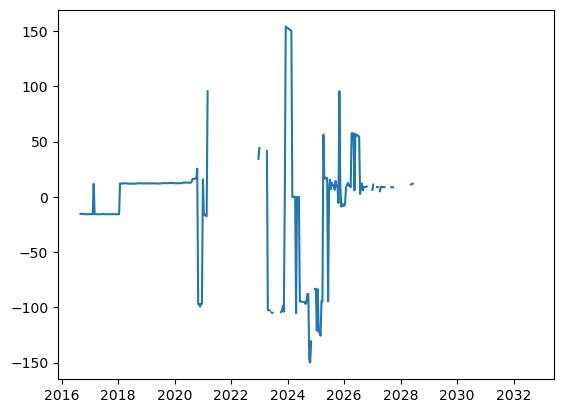

In [25]:
plt.plot(df['time'][60500:61000], df['leftshoulder_flex'][60500:61000])

In [ ]:

fig = px.scatter_3d(x = [point[0] for point in df['leftelbow'][60500:61000]], 
                    y = [point[1] for point in df['leftelbow'][60500:61000]], 
                    z = [point[0] for point in df['leftelbow'][60500:61000]])
fig.show()

In [94]:
#plt.plot(df['leftshoulder_flex'][60000:61000])
def plot_trajectory(data, t1, t2, joint, event):
    xdata = [point[0] for point in data[joint][t1: t2]]
    ydata = [point[1] for point in data[joint][t1: t2]]
    zdata = [point[2] for point in data[joint][t1: t2]]

    fig = px.line_3d(x = xdata, y = ydata, z = zdata, title=f'{joint} while {event}')
    fig.show()
    """
    fig = plt.figure(figsize=(10,10))
    ax = plt.axes(projection='3d')
    ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens')
    ax.set_title(f'{joint} trajectory when {event}')
    """
plot_trajectory(df, 60500, 61000, 'leftelbow', 'blbl')

In [84]:
df['leftelbow'][60000:61000].shape[0]

500

Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x183479a80>
Traceback (most recent call last):
  File "/Users/changling/opt/anaconda3/envs/skproject/lib/python3.11/site-packages/matplotlib/transforms.py", line 209, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id(self): pop(k))

KeyboardInterrupt: 


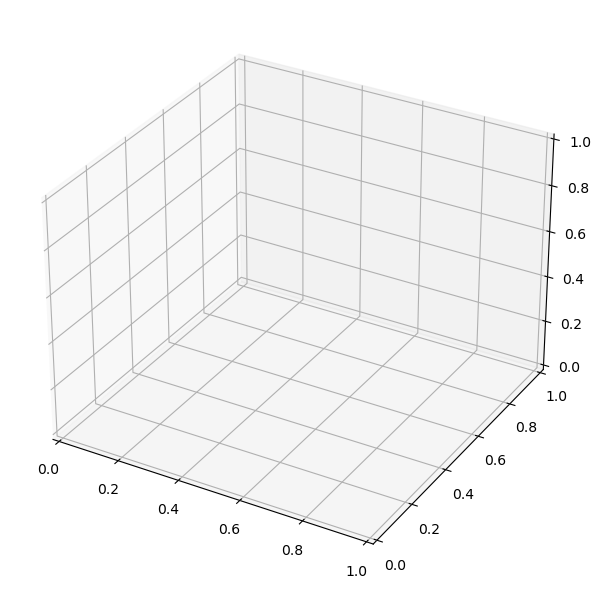

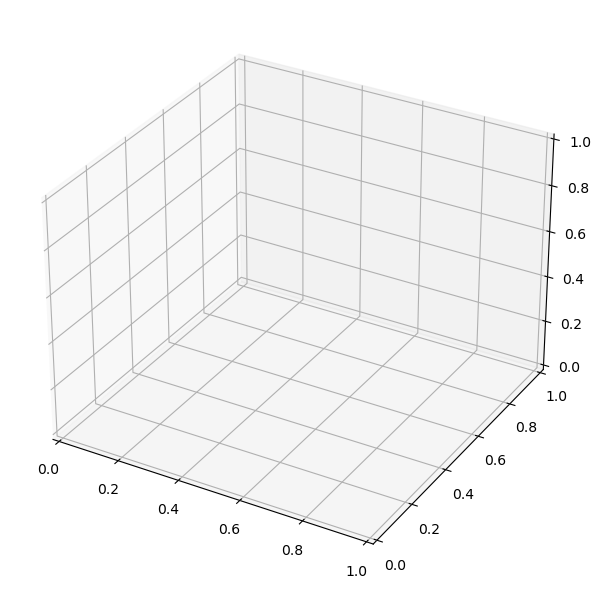

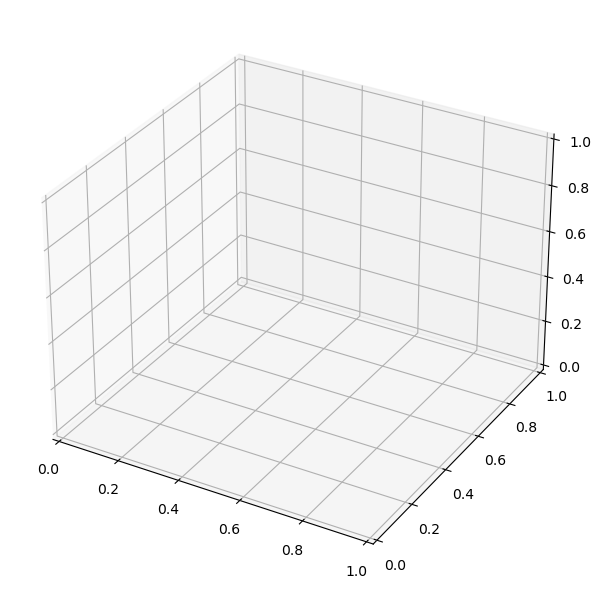

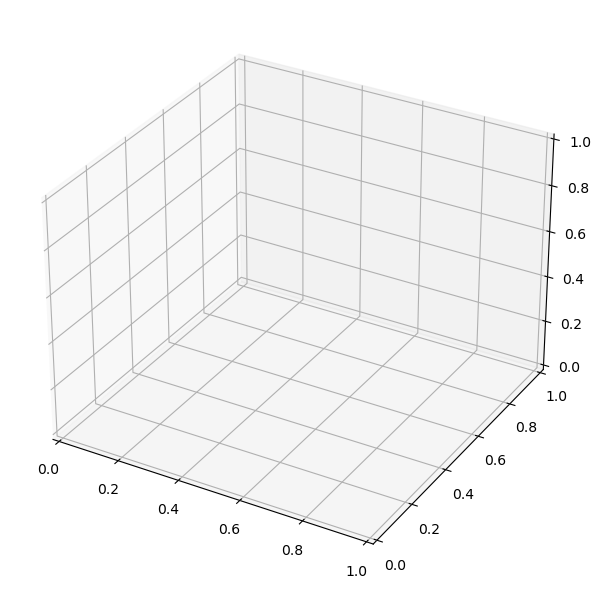

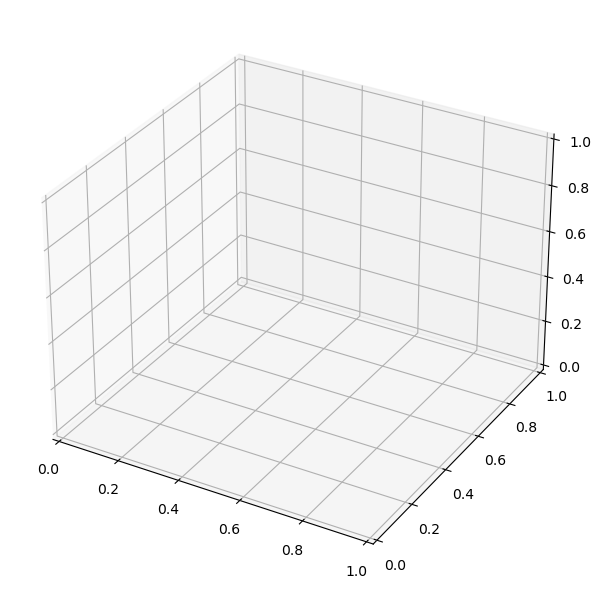

...

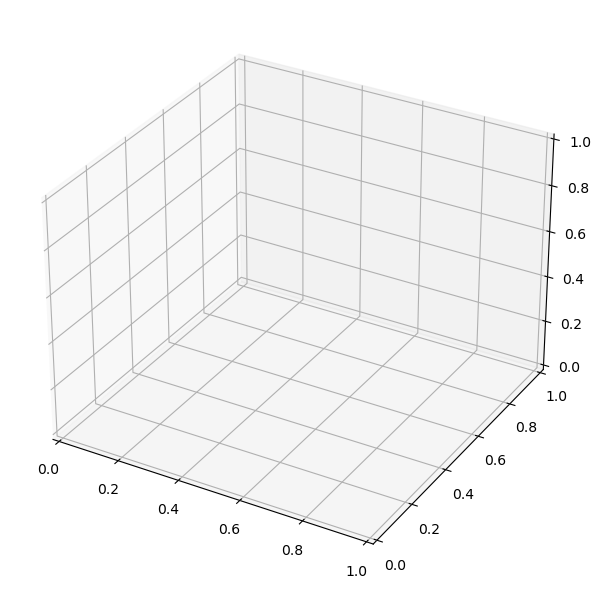

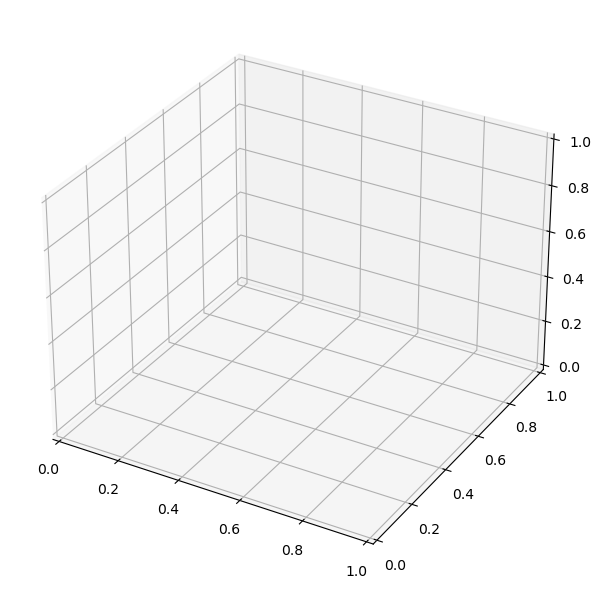

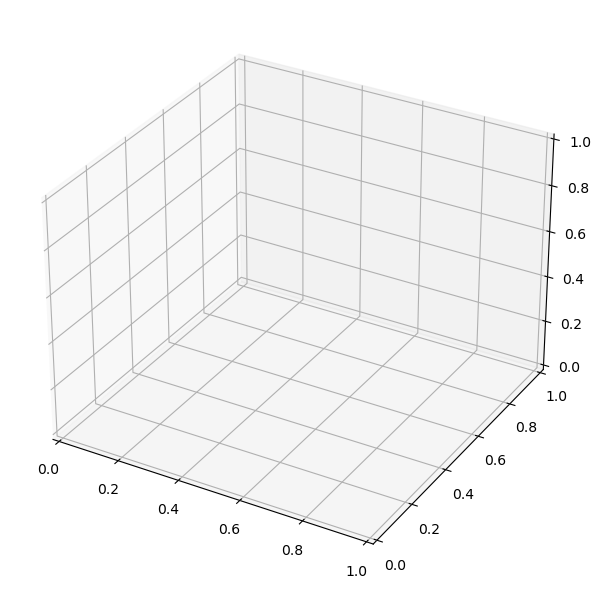

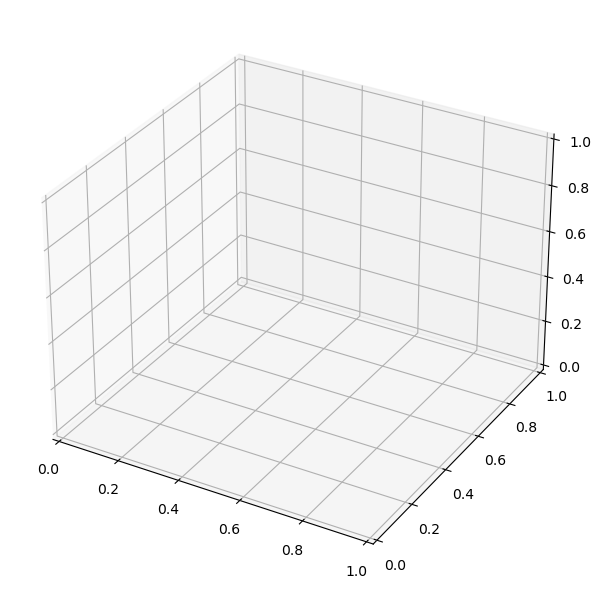

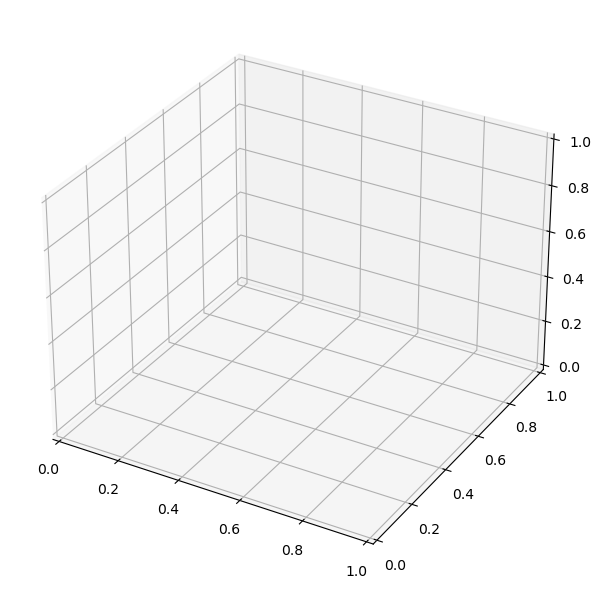

In [180]:
skeleton_frames(df, 3500, 3600)

In [185]:
video_skeleton('test')
empty_plot_img()


(<unknown>:79890): GStreamer-CRITICAL **: 11:13:16.666: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@2943.802] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ERROR:0@2943.803] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (597) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): videos/test.avi in function 'icvExtractPattern'


